In [1]:
%cd ../..

C:\Users\ManuJoseph\OneDrive - Thoucentric\Work\Projects\Playground\AdvancedTimeSeriesForecastingBook\Github\Modern-Time-Series-Forecasting-with-Python-


In [3]:
import numpy as np
import pandas as pd
import time
import plotly.express as px
import plotly.graph_objects as go
import os
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path
from tqdm.autonotebook import tqdm
import warnings
import humanize

#If importing darts is throwing an error, import torch beforehand and then import darts
# import torch
from darts import TimeSeries
from darts.models import (
    NaiveSeasonal,
    NaiveMean,
    NaiveDrift,
    ExponentialSmoothing,
    AutoARIMA,
    ARIMA,
    Theta,
    FFT
)

from darts.metrics import mase, mse, mae, ope

from src.utils.ts_utils import forecast_bias
from src.utils.general import LogTime
from src.utils import plotting_utils
%load_ext autoreload
%autoreload 2
np.random.seed(42)
tqdm.pandas()

In [4]:
os.makedirs("imgs/chapter_4", exist_ok=True)
preprocessed = Path("data/london_smart_meters/preprocessed")

In [8]:
def format_plot(fig, legends = None, xlabel="Time", ylabel="Value", title="", font_size=15):
    if legends:
        names = cycle(legends)
        fig.for_each_trace(lambda t:  t.update(name = next(names)))
    fig.update_layout(
            autosize=False,
            width=900,
            height=500,
            title_text=title,
            title={
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
            titlefont={
                "size": 20
            },
            legend_title = None,
            legend=dict(
                font=dict(size=font_size),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                title_text=ylabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            ),
            xaxis=dict(
                title_text=xlabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            )
        )
    return fig

In [9]:
#Readin the missing value imputed and train test split data
train_df = pd.read_parquet(preprocessed/"block_0-7_train_missing_imputed.parquet")
val_df = pd.read_parquet(preprocessed/"block_0-7_val_missing_imputed.parquet")
test_df = pd.read_parquet(preprocessed/"block_0-7_test_missing_imputed.parquet")

In [10]:
len(train_df.LCLid.unique())

399

In [11]:
#picking a single time series from the dataset for illustration
freq = train_df.iloc[0]['frequency']
ts_train = train_df.loc[train_df.LCLid=="MAC000193", ["timestamp","energy_consumption"]].set_index("timestamp")
ts_val = val_df.loc[val_df.LCLid=="MAC000193", ["timestamp","energy_consumption"]].set_index("timestamp")
ts_test = test_df.loc[test_df.LCLid=="MAC000193", ["timestamp","energy_consumption"]].set_index("timestamp")

# Baseline Forecasts

In [12]:
pred_df = pd.concat([ts_train, ts_val])
metric_record = []

ts_train = TimeSeries.from_series(ts_train)
ts_val = TimeSeries.from_series(ts_val)
ts_test = TimeSeries.from_series(ts_test)

In [13]:
def eval_model(model, ts_train, ts_test, name=None):
    if name is None:
        name = type(model).__name__
    model.fit(ts_train)
    y_pred = model.predict(len(ts_test))
    return y_pred, {
        "Algorithm": name,
        "MAE": mae(actual_series = ts_test, pred_series = y_pred),
        "MSE": mse(actual_series = ts_test, pred_series = y_pred),
        "MASE": mase(actual_series = ts_test, pred_series = y_pred, insample=ts_train),
        "Forecast Bias": forecast_bias(actual_series = ts_test, pred_series = y_pred)
    }

def format_y_pred(y_pred, name):
    y_pred = y_pred.data_array().to_series()
    y_pred.index = y_pred.index.get_level_values(0)
    y_pred.name = name
    return y_pred

In [21]:
from itertools import cycle
def plot_forecast(pred_df, forecast_columns, forecast_display_names=None):
    if forecast_display_names is None:
        forecast_display_names = forecast_columns
    else:
        assert len(forecast_columns)==len(forecast_display_names)
    mask = ~pred_df[forecast_columns[0]].isnull()
    colors = ["rgba("+",".join([str(c) for c in plotting_utils.hex_to_rgb(c)])+",<alpha>)" for c in px.colors.qualitative.Plotly]
    act_color = colors[0]
    colors = cycle(colors[1:])
    dash_types = cycle(["dash","dot","dashdot"])
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=pred_df[mask].index, y=pred_df[mask].energy_consumption,
                        mode='lines', line = dict(color=act_color.replace("<alpha>", "0.9")),
                        name='Actual Consumption'))
    for col, display_col in zip(forecast_columns,forecast_display_names):
        fig.add_trace(go.Scatter(x=pred_df[mask].index, y=pred_df.loc[mask, col],
                            mode='lines', line = dict(dash=next(dash_types), color=next(colors).replace("<alpha>", "1")),
                            name=display_col))
    return fig

## Naive Forecast

In [15]:
name = "Naive"
naive_model = NaiveSeasonal(K=1)
with LogTime() as timer:
    y_pred, metrics = eval_model(naive_model, ts_train, ts_val, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "naive_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


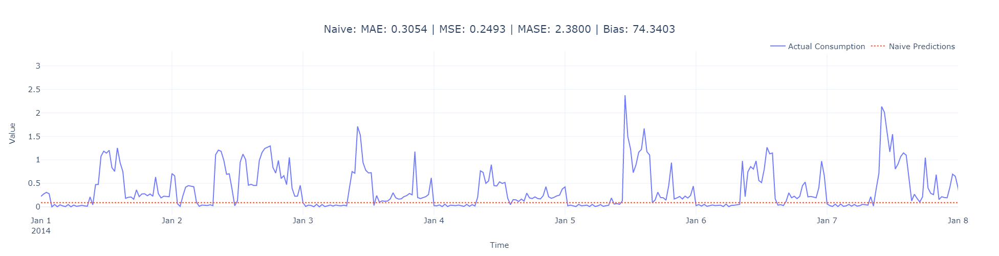

In [16]:
fig = plot_forecast(pred_df, forecast_columns=["naive_predictions"], forecast_display_names=['Naive Predictions'])
fig = format_plot(fig, title=f"Naive: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

## Moving Average Forecast

In [17]:
from src.forecasting.baselines import NaiveMovingAverage

In [18]:
name = "Moving Average Forecast"
naive_model = NaiveMovingAverage(window=48)
with LogTime() as timer:
    y_pred, metrics = eval_model(naive_model, ts_train, ts_val, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "moving_average_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


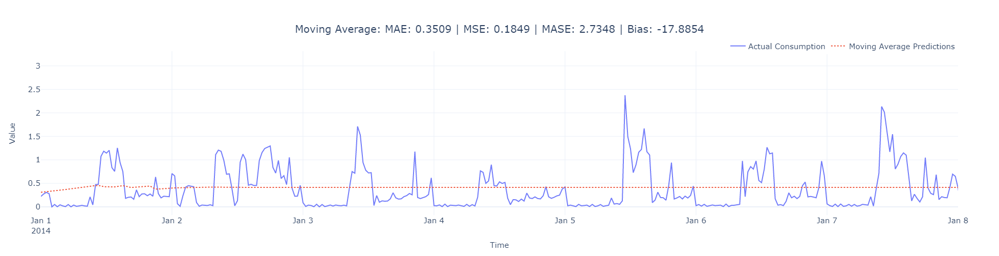

In [19]:
fig = plot_forecast(pred_df, forecast_columns=["moving_average_predictions"], forecast_display_names=['Moving Average Predictions'])
fig = format_plot(fig, title=f"Moving Average: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

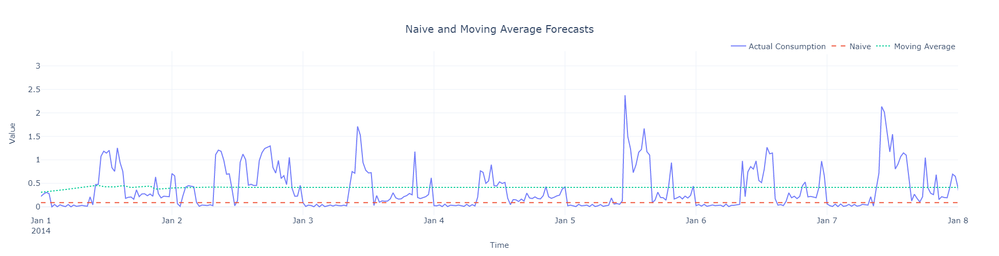

In [23]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "naive_predictions",
                        "moving_average_predictions"
                    ], 
                    forecast_display_names=[
                        "Naive",
                        'Moving Average'
                    ])
fig = format_plot(fig, title=f"Naive and Moving Average Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
# fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/naive_ma.png")
fig.show()

## Seasonal Naive Forecast

In [24]:
name = "Seasonal Naive Forecast"
naive_model = NaiveSeasonal(K=48*7)
with LogTime() as timer:
    y_pred, metrics = eval_model(naive_model, ts_train, ts_val, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "snaive_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


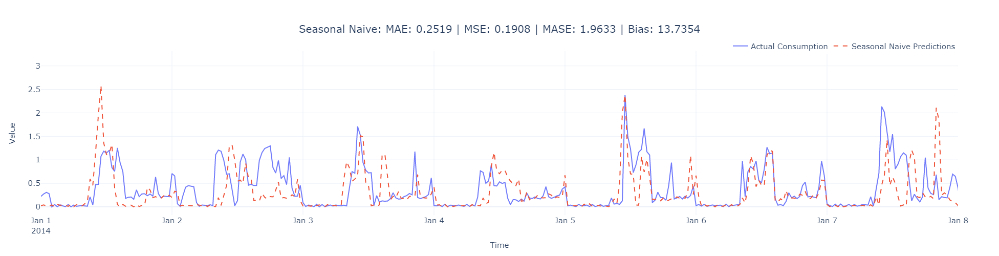

In [25]:
fig = plot_forecast(pred_df, forecast_columns=["snaive_predictions"], forecast_display_names=['Seasonal Naive Predictions'])
fig = format_plot(fig, title=f"Seasonal Naive: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

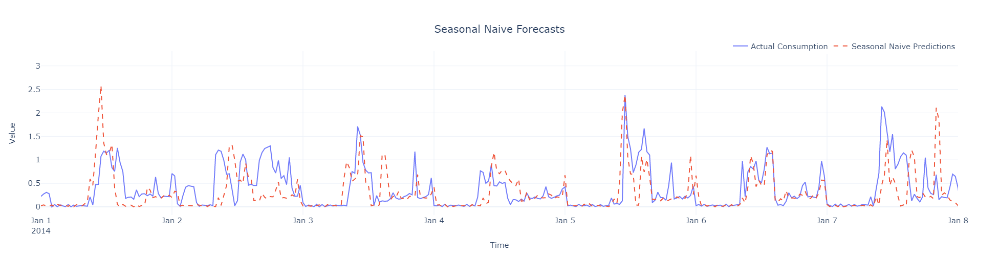

In [26]:
fig = plot_forecast(pred_df, forecast_columns=["snaive_predictions"], forecast_display_names=['Seasonal Naive Predictions'])
fig = format_plot(fig, title=f"Seasonal Naive Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
# fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/snaive.png")
fig.show()

## Exponential Smoothing Forecast

In [27]:
from darts.utils.utils import ModelMode, SeasonalityMode

In [28]:
name = "Exponential Smoothing"
# Suppress FutureWarning
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    ets_model = ExponentialSmoothing(trend=ModelMode.ADDITIVE, damped=True, seasonal=SeasonalityMode.ADDITIVE, seasonal_periods=48*7, random_state=42)
    with LogTime() as timer:
        y_pred, metrics = eval_model(ets_model, ts_train, ts_val, name=name)
    metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "ets_predictions")
pred_df = pred_df.join(y_pred)

C:\Users\ManuJoseph\miniconda3\envs\modern_ts\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Time Elapsed: 18 seconds


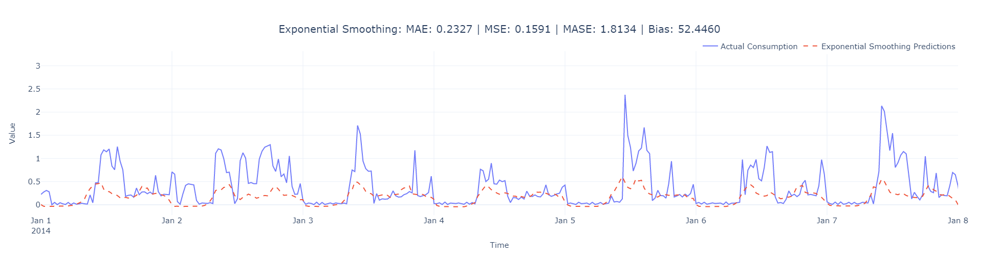

In [29]:
fig = plot_forecast(pred_df, forecast_columns=["ets_predictions"], forecast_display_names=['Exponential Smoothing Predictions'])
fig = format_plot(fig, title=f"Exponential Smoothing: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

## ARIMA

In [30]:
name = "ARIMA"
#Not using AutoARIMA because it just takes too much time for long time series
# arima_model = AutoARIMA(max_p=5, max_q=3, m=48, seasonal=False)
arima_model = ARIMA(p=2, d=1, q=1, seasonal_order=(1, 1, 1, 48))
# Taking only latest 8000 points for training (Time constraints)
# Reduce 8000 if it is taking too much time or consuming all the memory
with LogTime() as timer:
    y_pred, metrics = eval_model(arima_model, ts_train[-8000:], ts_val,  name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "arima_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 4 minutes and 29 seconds


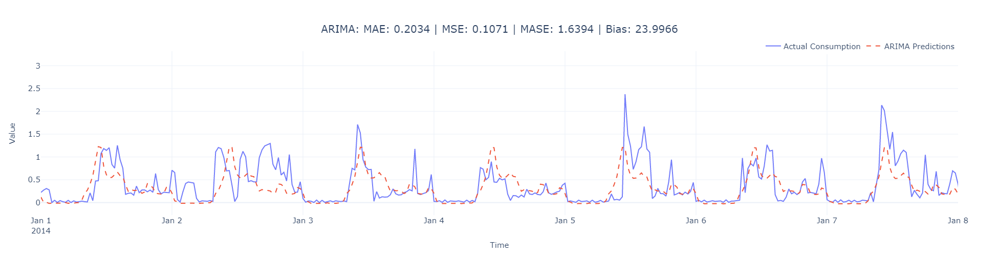

In [31]:
fig = plot_forecast(pred_df, forecast_columns=["arima_predictions"], forecast_display_names=['ARIMA Predictions'])
fig = format_plot(fig, title=f"ARIMA: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

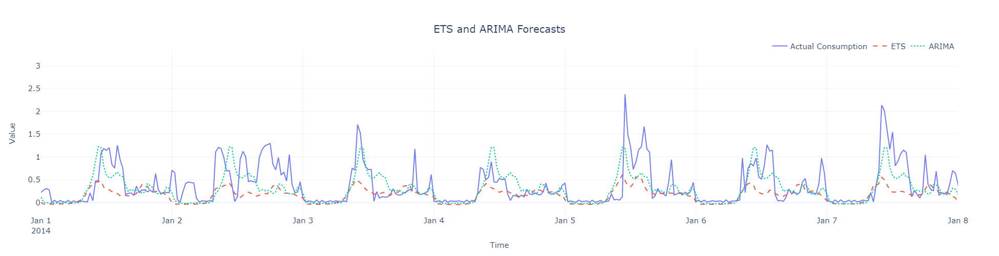

In [32]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "ets_predictions",
                        "arima_predictions"
                    ], 
                    forecast_display_names=[
                        "ETS",
                        'ARIMA'
                    ])
fig = format_plot(fig, title=f"ETS and ARIMA Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
# fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/ets_arima.png")
fig.show()

## Theta

In [33]:
name = "Theta"
theta_model = Theta(theta=3, seasonality_period=48*7, season_mode=SeasonalityMode.ADDITIVE)
with LogTime() as timer:
    y_pred, metrics = eval_model(theta_model, ts_train, ts_val, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "theta_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


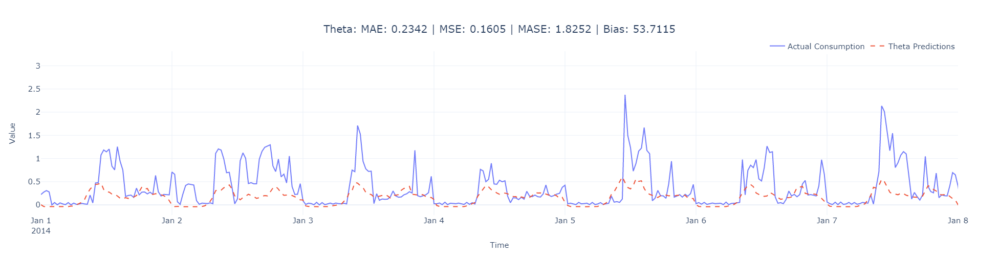

In [34]:
fig = plot_forecast(pred_df, forecast_columns=["theta_predictions"], forecast_display_names=['Theta Predictions'])
fig = format_plot(fig, title=f"Theta: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

## FFT

In [35]:
name = "FFT"
fft_model = FFT(nr_freqs_to_keep=35, trend="poly", trend_poly_degree=2)
with LogTime() as timer:
    y_pred, metrics = eval_model(fft_model, ts_train, ts_val, name=name)
metrics['Time Elapsed'] = timer.elapsed
metric_record.append(metrics)
y_pred = format_y_pred(y_pred, "fft_predictions")
pred_df = pred_df.join(y_pred)

Time Elapsed: 0 microseconds


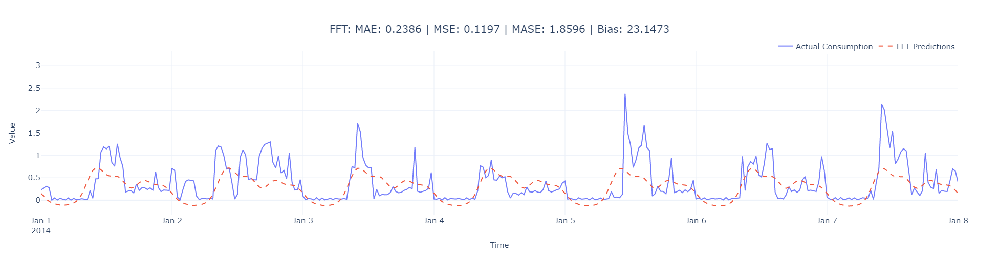

In [36]:
fig = plot_forecast(pred_df, forecast_columns=["fft_predictions"], forecast_display_names=['FFT Predictions'])
fig = format_plot(fig, title=f"FFT: MAE: {metrics['MAE']:.4f} | MSE: {metrics['MSE']:.4f} | MASE: {metrics['MASE']:.4f} | Bias: {metrics['Forecast Bias']:.4f}")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
fig.show()

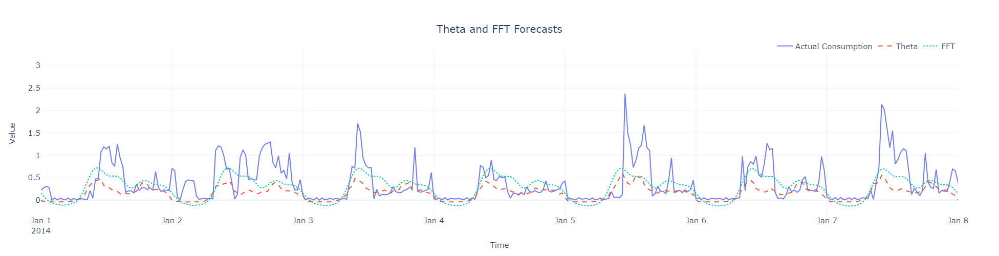

In [37]:
fig = plot_forecast(pred_df, 
                    forecast_columns=[
                        "theta_predictions",
                        "fft_predictions"
                    ], 
                    forecast_display_names=[
                        "Theta",
                        'FFT'
                    ])
fig = format_plot(fig, title=f"Theta and FFT Forecasts")
fig.update_xaxes(type="date", range=["2014-01-01", "2014-01-08"])
# fig = plotting_utils.make_lines_greyscale(fig)
fig.write_image("imgs/chapter_4/theta_fft.png")
fig.show()

In [44]:
metric_styled = pd.DataFrame(metric_record).style.format({"MAE": "{:.3f}", 
                          "MSE": "{:.3f}", 
                          "MASE": "{:.3f}", 
                          "Forecast Bias": "{:.2f}%"}).highlight_min(color='lightgreen', subset=["MAE","MSE","MASE","Time Elapsed"])
display(metric_styled)

,Algorithm,MAE,MSE,MASE,Forecast Bias,Time Elapsed
0,Naive,0.305,0.249,2.380,74.34%,0.093749
1,Moving Average Forecast,0.351,0.185,2.735,-17.89%,0.193995
2,Seasonal Naive Forecast,0.252,0.191,1.963,13.74%,0.113210
3,Exponential Smoothing,0.235,0.162,1.835,54.74%,20.735852
4,ARIMA,0.203,0.107,1.640,24.02%,266.272803
5,Theta,0.234,0.160,1.825,53.71%,1.182515
6,FFT,0.239,0.120,1.860,23.15%,0.515506


Although ARIMA gives us the best metrics, it takes too long to run, even with a sampled timeseries.
We can see that Theta or FFT metrics are lower and doesn't take much time to run. So let's run Theta and FFT for all the consumers in blocks 0-7.

## Running Baseline Forecast for all consumers

In [37]:
lcl_ids = sorted(train_df.LCLid.unique())

### Forecasting for Validation Period

#### Theta Forecast

In [38]:
name = "Theta"
theta_preds = []
theta_metrics = []
for lcl_id in tqdm(lcl_ids):
    theta_model = Theta(theta=3, seasonality_period=48*7, season_mode=SeasonalityMode.ADDITIVE)
    tr = TimeSeries.from_series(train_df.loc[train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    vl = TimeSeries.from_series(val_df.loc[val_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    # ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(theta_model, tr, vl, name=name)
    y_pred = format_y_pred(y_pred, "predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    y_pred['Algorithm'] = name
    metrics["LCLid"] = lcl_id
    metrics['Algorithm'] = name
    y_pred['energy_consumption'] = vl.data_array().to_series().values
    theta_preds.append(y_pred)
    theta_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



In [39]:
theta_val_pred_df = pd.concat(theta_preds)
theta_val_pred_df.head()

,predictions,LCLid,Algorithm,energy_consumption
time,,,,
2014-01-01 00:00:00,0.398836,MAC000002,Theta,0.496
2014-01-01 00:30:00,0.380464,MAC000002,Theta,0.427
2014-01-01 01:00:00,0.369484,MAC000002,Theta,0.469
2014-01-01 01:30:00,0.328537,MAC000002,Theta,0.362
2014-01-01 02:00:00,0.306195,MAC000002,Theta,0.452


In [40]:
theta_val_metric_df = pd.DataFrame(theta_metrics)
theta_val_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.194516,0.070589,1.806288,-18.078678,MAC000002
1,Theta,0.077401,0.012990,1.374814,-26.002084,MAC000005
2,Theta,0.115747,0.030351,1.741755,76.433565,MAC000017
3,Theta,0.132027,0.065441,1.209962,29.189195,MAC000030
4,Theta,0.290808,0.151908,1.534895,-4.531981,MAC000040


In [41]:
actual_series = TimeSeries.from_values(theta_val_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(theta_val_pred_df.predictions.values)

In [42]:
overall_metrics_val_theta = {
    "Algorithm": "Theta",
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": theta_val_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_val_theta

{'Algorithm': 'Theta',
 'MAE': 0.2288118963654016,
 'MSE': 0.1583528857980221,
 'meanMASE': 2.0497737543343932,
 'Forecast Bias': 12.13075548868035}

#### FFT

In [45]:
name = "FFT"
fft_preds = []
fft_metrics = []
for lcl_id in tqdm(lcl_ids):
    fft_model = FFT(nr_freqs_to_keep=35, trend="poly", trend_poly_degree=2)
    tr = TimeSeries.from_series(train_df.loc[train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    vl = TimeSeries.from_series(val_df.loc[val_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    # ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(fft_model, tr, vl, name=name)
    y_pred = format_y_pred(y_pred, "predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    y_pred['Algorithm'] = name
    metrics["LCLid"] = lcl_id
    metrics['Algorithm'] = name
    y_pred['energy_consumption'] = vl.data_array().to_series().values
    fft_preds.append(y_pred)
    fft_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

In [46]:
fft_val_pred_df = pd.concat(fft_preds)
fft_val_pred_df.head()

,predictions,LCLid,Algorithm,energy_consumption
time,,,,
2014-01-01 00:00:00,0.255057,MAC000002,FFT,0.496
2014-01-01 00:30:00,0.234834,MAC000002,FFT,0.427
2014-01-01 01:00:00,0.207254,MAC000002,FFT,0.469
2014-01-01 01:30:00,0.175136,MAC000002,FFT,0.362
2014-01-01 02:00:00,0.144155,MAC000002,FFT,0.452


In [47]:
fft_val_metric_df = pd.DataFrame(fft_metrics)
fft_val_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,FFT,0.162886,0.070822,1.512565,24.216177,MAC000002
1,FFT,0.058189,0.013391,1.033575,14.977678,MAC000005
2,FFT,0.085597,0.018900,1.288066,-13.337820,MAC000017
3,FFT,0.185160,0.073561,1.696903,-22.628537,MAC000030
4,FFT,0.372290,0.181152,1.964964,-25.265914,MAC000040


In [48]:
actual_series = TimeSeries.from_values(fft_val_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(fft_val_pred_df.predictions.values)

In [49]:
overall_metrics_val_fft = {
    "Algorithm": "FFT",
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": fft_val_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_val_fft

{'Algorithm': 'FFT',
 'MAE': 0.17263646489772896,
 'MSE': 0.09431091970588633,
 'meanMASE': 1.7210202492738251,
 'Forecast Bias': 13.908513802081583}

#### Evaluation of Baseline Forecast

In [61]:
agg_val_metrics_df = pd.DataFrame([overall_metrics_val_fft, overall_metrics_val_theta])

display(agg_val_metrics_df.style.format({"MAE": "{:.3f}", 
                          "MSE": "{:.3f}", 
                          "meanMASE": "{:.3f}", 
                          "Forecast Bias": "{:.2f}%"}).highlight_min(color='lightgreen', subset=["MAE","MSE","meanMASE"]))

,Algorithm,MAE,MSE,meanMASE,Forecast Bias
0,FFT,0.173,0.094,1.721,13.91%
1,Theta,0.229,0.158,2.050,12.13%


In [62]:
baseline_val_pred_df = pd.concat([theta_val_pred_df, fft_val_pred_df])

In [63]:
baseline_val_metrics_df = pd.concat([theta_val_metric_df, fft_val_metric_df])
baseline_val_metrics_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.194516,0.070589,1.806288,-18.078678,MAC000002
1,Theta,0.077401,0.012990,1.374814,-26.002084,MAC000005
2,Theta,0.115747,0.030351,1.741755,76.433565,MAC000017
3,Theta,0.132027,0.065441,1.209962,29.189195,MAC000030
4,Theta,0.290808,0.151908,1.534895,-4.531981,MAC000040


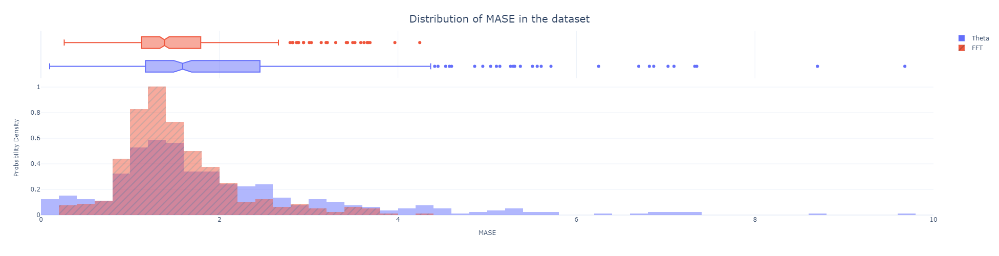

In [64]:
fig = px.histogram(baseline_val_metrics_df, 
                   x="MASE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MASE", ylabel="Probability Density", title="Distribution of MASE in the dataset")
fig.update_layout(xaxis_range=[0,10])
fig.write_image("imgs/chapter_4/mase_dist.png")
fig.show()

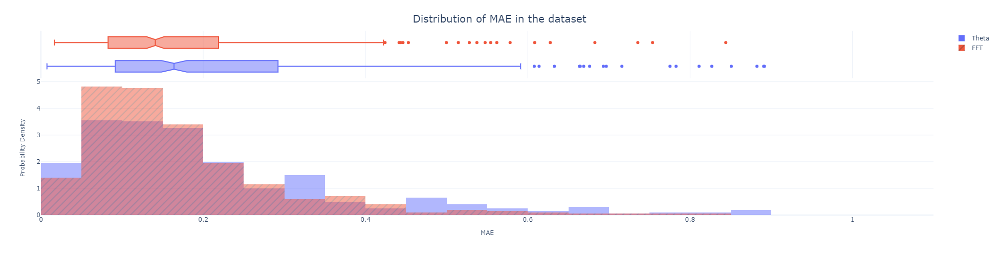

In [65]:
fig = px.histogram(baseline_val_metrics_df, 
                   x="MAE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=100, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MAE", ylabel="Probability Density", title="Distribution of MAE in the dataset")
fig.write_image("imgs/chapter_4/mae_dist.png")
fig.update_layout(xaxis_range=[0,1.1])
fig.show()

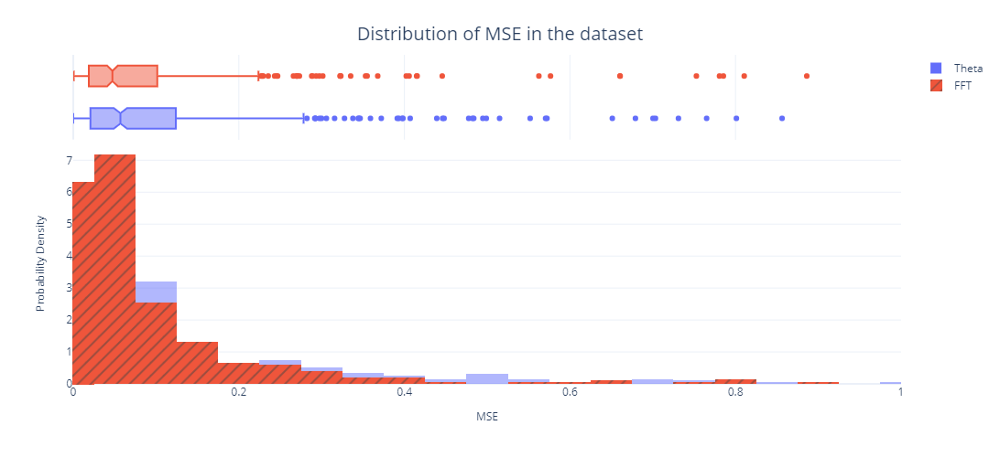

In [66]:
fig = px.histogram(baseline_val_metrics_df, 
                   x="MSE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MSE", ylabel="Probability Density", title="Distribution of MSE in the dataset")
fig.update_layout(xaxis_range=[0,1])
fig.write_image("imgs/chapter_4/mse_dist.png")
fig.show()

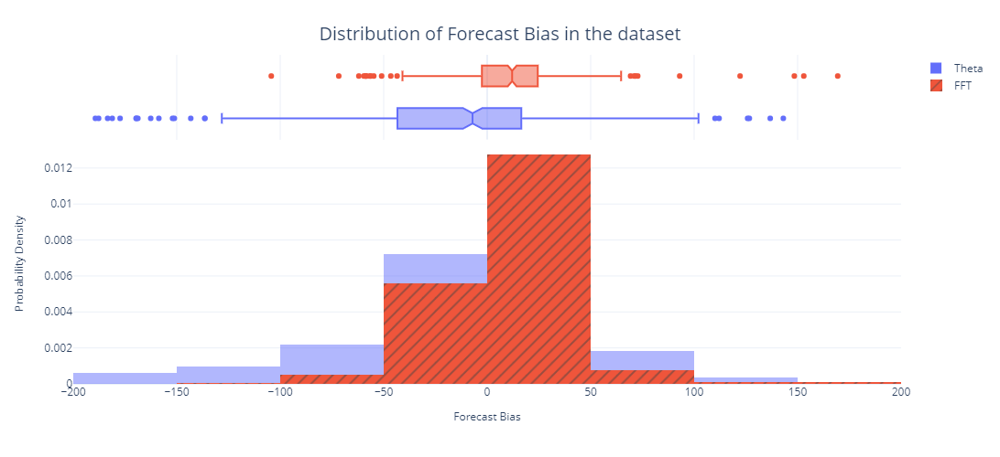

In [67]:
fig = px.histogram(baseline_val_metrics_df, 
                   x="Forecast Bias", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=250,
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="Forecast Bias", ylabel="Probability Density", title="Distribution of Forecast Bias in the dataset")
fig.update_layout(xaxis_range=[-200,200])
fig.write_image("imgs/chapter_4/bias_dist.png")
fig.show()

#### Saving the Baseline Forecasts and Metrics

In [68]:
os.makedirs("data/london_smart_meters/output", exist_ok=True)
output = Path("data/london_smart_meters/output")

In [69]:
baseline_val_pred_df.to_pickle(output/"baseline_val_prediction_df.pkl")
baseline_val_metrics_df.to_pickle(output/"baseline_val_metrics_df.pkl")
agg_val_metrics_df.to_pickle(output/"baseline_val_aggregate_metrics.pkl")

### Forecasting for Test Period

In [70]:
_train_df = pd.concat([train_df, val_df])

#### Theta Forecast

In [71]:
name = "Theta"
theta_preds = []
theta_metrics = []
for lcl_id in tqdm(lcl_ids):
    theta_model = Theta(theta=3, seasonality_period=48*7, season_mode=SeasonalityMode.ADDITIVE)
    tr = TimeSeries.from_series(_train_df.loc[_train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(theta_model, tr, ts, name=name)
    y_pred = format_y_pred(y_pred, "predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    y_pred['Algorithm'] = name
    metrics["LCLid"] = lcl_id
    metrics['Algorithm'] = name
    y_pred['energy_consumption'] = ts.data_array().to_series().values
    theta_preds.append(y_pred)
    theta_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

D:\miniconda3\envs\modern_ts_v5\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



In [72]:
theta_test_pred_df = pd.concat(theta_preds)
theta_test_pred_df.head()

,predictions,LCLid,Algorithm,energy_consumption
time,,,,
2014-02-01 00:00:00,0.715278,MAC000002,Theta,0.517
2014-02-01 00:30:00,0.710749,MAC000002,Theta,0.476
2014-02-01 01:00:00,0.705158,MAC000002,Theta,0.324
2014-02-01 01:30:00,0.658215,MAC000002,Theta,0.136
2014-02-01 02:00:00,0.625078,MAC000002,Theta,0.097


In [73]:
theta_test_metric_df = pd.DataFrame(theta_metrics)
theta_test_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.415708,0.199068,3.850205,-114.876172,MAC000002
1,Theta,0.069669,0.012845,1.223890,-12.711227,MAC000005
2,Theta,0.130693,0.025577,1.963700,-44.722239,MAC000017
3,Theta,0.132903,0.065264,1.216094,24.679302,MAC000030
4,Theta,0.377629,0.192643,1.943387,-15.629672,MAC000040


In [74]:
actual_series = TimeSeries.from_values(theta_test_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(theta_test_pred_df.predictions.values)

In [75]:
overall_metrics_test_theta = {
    "Algorithm": "Theta",
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": theta_test_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_test_theta

{'Algorithm': 'Theta',
 'MAE': 0.19206773083864526,
 'MSE': 0.11377830521667144,
 'meanMASE': 1.7169137796922318,
 'Forecast Bias': 10.122031317387881}

#### FFT

In [76]:
name = "FFT"
fft_preds = []
fft_metrics = []
for lcl_id in tqdm(lcl_ids):
    fft_model = FFT(nr_freqs_to_keep=35, trend="poly", trend_poly_degree=2)
    tr = TimeSeries.from_series(_train_df.loc[_train_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    ts = TimeSeries.from_series(test_df.loc[test_df.LCLid==lcl_id, ["timestamp","energy_consumption"]].set_index("timestamp"))
    y_pred, metrics = eval_model(fft_model, tr, ts, name=name)
    y_pred = format_y_pred(y_pred, "predictions").to_frame()
    y_pred['LCLid'] = lcl_id
    y_pred['Algorithm'] = name
    metrics["LCLid"] = lcl_id
    metrics['Algorithm'] = name
    y_pred['energy_consumption'] = ts.data_array().to_series().values
    fft_preds.append(y_pred)
    fft_metrics.append(metrics)

  0%|          | 0/399 [00:00<?, ?it/s]

In [77]:
fft_test_pred_df = pd.concat(fft_preds)
fft_test_pred_df.head()

,predictions,LCLid,Algorithm,energy_consumption
time,,,,
2014-02-01 00:00:00,0.391372,MAC000002,FFT,0.517
2014-02-01 00:30:00,0.365121,MAC000002,FFT,0.476
2014-02-01 01:00:00,0.328820,MAC000002,FFT,0.324
2014-02-01 01:30:00,0.285124,MAC000002,FFT,0.136
2014-02-01 02:00:00,0.239950,MAC000002,FFT,0.097


In [78]:
fft_test_metric_df = pd.DataFrame(fft_metrics)
fft_test_metric_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,FFT,0.158578,0.065381,1.468718,0.201847,MAC000002
1,FFT,0.061496,0.013785,1.080318,12.170142,MAC000005
2,FFT,0.088797,0.019696,1.334194,-3.631118,MAC000017
3,FFT,0.176924,0.070327,1.618901,-22.455564,MAC000030
4,FFT,0.401340,0.205477,2.065408,-21.558479,MAC000040


In [79]:
actual_series = TimeSeries.from_values(fft_test_pred_df.energy_consumption.values)
pred_series = TimeSeries.from_values(fft_test_pred_df.predictions.values)

In [80]:
overall_metrics_test_fft = {
    "Algorithm": "FFT",
    "MAE": mae(actual_series = actual_series, pred_series = pred_series),
    "MSE": mse(actual_series = actual_series, pred_series = pred_series),
    "meanMASE": fft_test_metric_df.MASE.mean(),
    "Forecast Bias": ope(actual_series = actual_series, pred_series = pred_series)
}
overall_metrics_test_fft

{'Algorithm': 'FFT',
 'MAE': 0.1666644814701883,
 'MSE': 0.08446508531717314,
 'meanMASE': 1.6357973486133222,
 'Forecast Bias': 5.2904142049921745}

### Evaluation of Baseline Forecast

In [81]:
agg_test_metrics_df = pd.DataFrame([overall_metrics_test_fft, overall_metrics_test_theta])

display(agg_test_metrics_df.style.format({"MAE": "{:.3f}", 
                          "MSE": "{:.3f}", 
                          "meanMASE": "{:.3f}", 
                          "Forecast Bias": "{:.2f}%"}).highlight_min(color='lightgreen', subset=["MAE","MSE","meanMASE"]))

,Algorithm,MAE,MSE,meanMASE,Forecast Bias
0,FFT,0.167,0.084,1.636,5.29%
1,Theta,0.192,0.114,1.717,10.12%


In [82]:
baseline_test_pred_df = pd.concat([theta_test_pred_df, fft_test_pred_df])

In [83]:
baseline_test_metrics_df = pd.concat([theta_test_metric_df, fft_test_metric_df])
baseline_test_metrics_df.head()

,Algorithm,MAE,MSE,MASE,Forecast Bias,LCLid
0,Theta,0.415708,0.199068,3.850205,-114.876172,MAC000002
1,Theta,0.069669,0.012845,1.223890,-12.711227,MAC000005
2,Theta,0.130693,0.025577,1.963700,-44.722239,MAC000017
3,Theta,0.132903,0.065264,1.216094,24.679302,MAC000030
4,Theta,0.377629,0.192643,1.943387,-15.629672,MAC000040


In [84]:
fig = px.histogram(baseline_test_metrics_df, 
                   x="MASE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MASE", ylabel="Probability Density", title="Distribution of MASE in the dataset")
fig.update_layout(xaxis_range=[0,10])
# fig.write_image("imgs/chapter_4/mase_dist.png")
fig.show()

In [85]:
fig = px.histogram(baseline_test_metrics_df, 
                   x="MAE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=100, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MAE", ylabel="Probability Density", title="Distribution of MAE in the dataset")
# fig.write_image("imgs/chapter_4/mae_dist.png")
fig.update_layout(xaxis_range=[0,1.1])
fig.show()

In [86]:
fig = px.histogram(baseline_test_metrics_df, 
                   x="MSE", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=500, 
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="MSE", ylabel="Probability Density", title="Distribution of MSE in the dataset")
fig.update_layout(xaxis_range=[0,1])
# fig.write_image("imgs/chapter_4/mse_dist.png")
fig.show()

In [87]:
fig = px.histogram(baseline_test_metrics_df, 
                   x="Forecast Bias", 
                   color="Algorithm",
                   pattern_shape="Algorithm", 
                   marginal="box", 
                   nbins=250,
                   barmode="overlay",
                   histnorm="probability density")
fig = format_plot(fig, xlabel="Forecast Bias", ylabel="Probability Density", title="Distribution of Forecast Bias in the dataset")
fig.update_layout(xaxis_range=[-200,200])
# fig.write_image("imgs/chapter_4/bias_dist.png")
fig.show()

### Saving the Baseline Forecasts and Metrics

In [88]:
os.makedirs("data/london_smart_meters/output", exist_ok=True)
output = Path("data/london_smart_meters/output")

In [ ]:
baseline_test_pred_df.to_pickle(output/"baseline_test_prediction_df.pkl")
baseline_test_metrics_df.to_pickle(output/"baseline_test_metrics_df.pkl")
agg_test_metrics_df.to_pickle(output/"baseline_test_aggregate_metrics.pkl")